# Object Detector

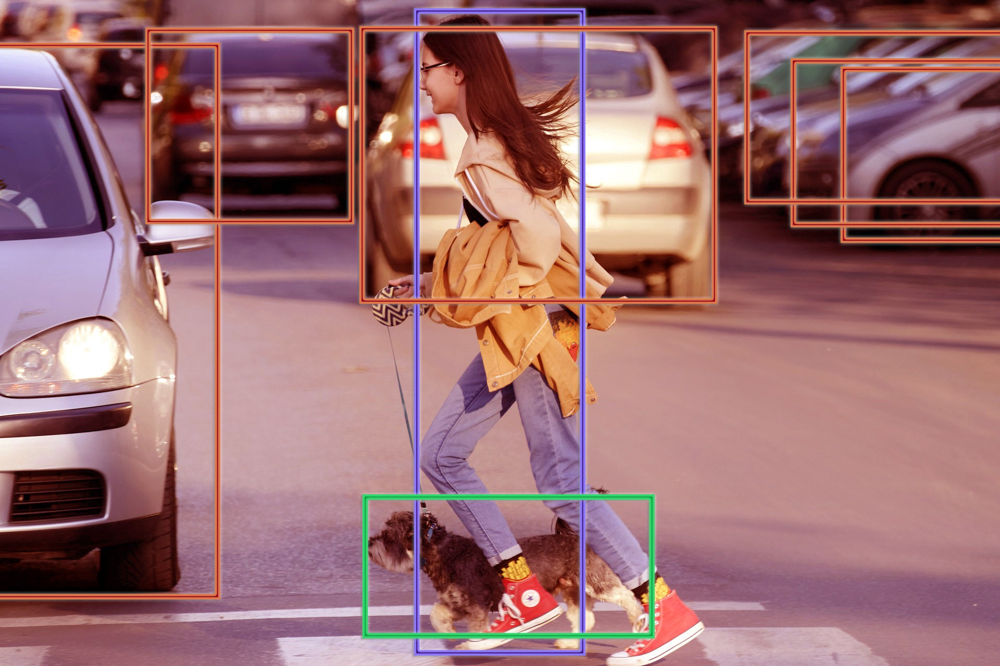

# 1. Что это такое 

Обнаружение объекта - это метод компьютерного зрения, при котором программная система может обнаруживать, определять местонахождение и отслеживать объект по заданному изображению или видео. Особый атрибут обнаружения объекта заключается в том, что он определяет класс объекта (человек, стол, стул и т. Д.) И их координаты, зависящие от местоположения на данном изображении. Местоположение указывается путем рисования ограничительной рамки вокруг объекта. Ограничивающая рамка может точно определять положение объекта, а может и нет. Возможность найти объект внутри изображения определяет производительность алгоритма, используемого для обнаружения.

Эти алгоритмы обнаружения объектов могут быть предварительно обучены или обучены с нуля. В большинстве случаев мы используем предварительно обученные веса из предварительно обученных моделей, а затем настраиваем их в соответствии с нашими требованиями и различными вариантами использования.

 # 2. Чем задача детекции отличается от классификации

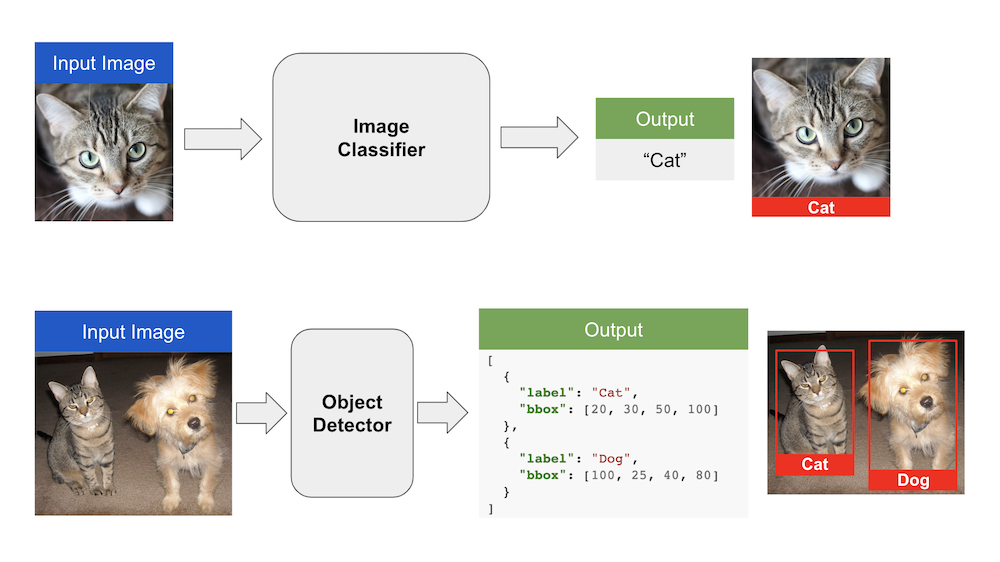

Классификация изображений - это задача, при которой мы назначаем метку класса входному изображению. Например, для входного изображения кошки на выходе алгоритма классификации изображений будет метка «Кошка».

При обнаружении объектов нас интересуют не только объекты, присутствующие во входном изображении. Нас также интересует, где они находятся во входном изображении. В этом смысле обнаружение объектов выходит за рамки классификации изображений.

В большинстве приложений с несколькими объектами на входном изображении нам нужно найти расположение объектов, а затем классифицировать их. В таких случаях мы используем алгоритм обнаружения объектов.

Обнаружение объектов может быть в сотни раз медленнее, чем классификация изображений. Поэтому в приложениях, где расположение объекта на изображении не важно, мы используем классификацию изображений.

## 1. Object detector

Проще говоря, обнаружение объекта - это двухэтапный процесс:

* Найдите ограничивающие прямоугольники, содержащие объекты, так чтобы в каждом ограничивающем прямоугольнике был только один объект.
* Классифицируйте изображение внутри каждого ограничивающего прямоугольника и присвойте ему метку.

## 3. Типы методов детектирования

## 3.1 Sliding Window Approach

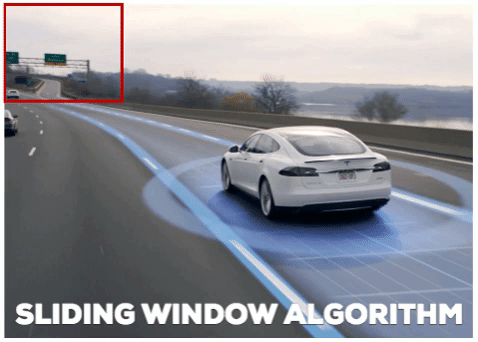

Большинство классических методов компьютерного зрения для обнаружения объектов, таких как каскады HAAR и HOG + SVM, используют метод скользящего окна для обнаружения объектов.

В этом подходе скользящее окно перемещается по изображению. Все пиксели внутри этого скользящего окна обрезаются и отправляются классификатору изображений.

Если классификатор изображения идентифицирует известный объект, ограничивающая рамка и метка класса сохраняются. В противном случае оценивается следующее окно.

Подход со скользящим окном является очень дорогостоящим в вычислительном отношении. Чтобы обнаруживать объекты на входном изображении, необходимо оценивать скользящие окна с разными масштабами и соотношениями сторон для каждого пикселя изображения.

Из-за затрат на вычисления скользящие окна используются только тогда, когда мы обнаруживаем один класс объектов с фиксированным соотношением сторон. Например, детектор лиц на основе HOG + SVM или HAAR в OpenCV использует подход скользящего окна. Интересно отметить, что знаменитая функция распознавания лиц Виолы Джонс использует скользящие окна. В случае детектора лиц сложность управляема, поскольку только квадратные ограничивающие рамки оцениваются в разных масштабах.

## 3.2 Two-shot Detectors

### 3.2.1 R-CNN Object Detector

[Статья(2013)](https://arxiv.org/abs/1311.2524)

Классификаторы изображений на основе сверточной нейронной сети (CNN) стали популярными после того, как метод на основе CNN выиграл конкурс [ImageNet Large Scale Visual Recognition Challenge (ILSVRC) в 2012 году](https://image-net.org/challenges/LSVRC/2012/index.php).

Поскольку в основе каждого детектора объектов лежит классификатор изображений, изобретение детектора объектов на основе CNN стало неизбежным.

Необходимо было преодолеть две проблемы:

* Классификаторы изображений на основе CNN были очень дорогими в вычислительном отношении по сравнению с традиционными методами, такими как каскады HOG + SVM или HAAR.
* Сообщество компьютерного зрения становилось все более амбициозным. Люди хотели создать мультиклассовый детектор объектов, который мог бы обрабатывать различные соотношения сторон в дополнение к возможности работать с разными масштабами.

Поэтому подход на основе скользящего окна для обнаружения объектов был исключен. Это было слишком дорого.  Исследователи начали работать над новой идеей обучения модели машинного обучения, которая могла бы предлагать местоположения ограничивающих рамок, содержащих объекты. Эти ограничивающие рамки назывались предложениями регионов или предложениями объектов.

Предложения по регионам представляли собой просто списки ограничивающих рамок с небольшой вероятностью содержания объекта. Он не знал и не заботился о том, какой объект находится в ограничивающей рамке.

Алгоритм предложения региона выводит список из нескольких сотен ограничивающих рамок в разных местах, масштабах и соотношениях сторон. Большинство этих ограничивающих рамок НЕ содержат никаких объектов.  

Оценка классификатора изображений в нескольких сотнях ограничивающих прямоугольников, предложенных алгоритмом предложения региона, намного дешевле, чем его оценка в сотнях тысяч или даже миллионах ограничивающих прямоугольников в случае подхода со скользящим окном. Следовательно, алгоритм предложения региона по-прежнему полезен и временами удобен.

Один из первых подходов, в которых использовались предложения по регионам, был назван [Россом Гиршиком](https://www.rossgirshick.info/) и др. R-CNN (сокращение от Regions with CNN features).

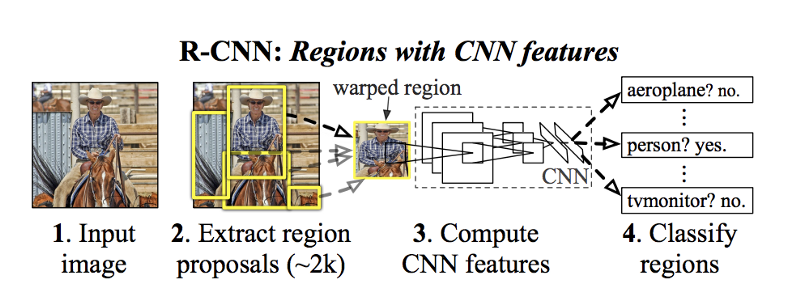

Они использовали алгоритм под названием [Selective Search](https://www.koen.me/research/pub/uijlings-ijcv2013-draft.pdf) для обнаружения 2000 предложений регионов и запустили классификатор изображений на основе CNN + SVM на этих 2000 ограничивающих прямоугольниках.

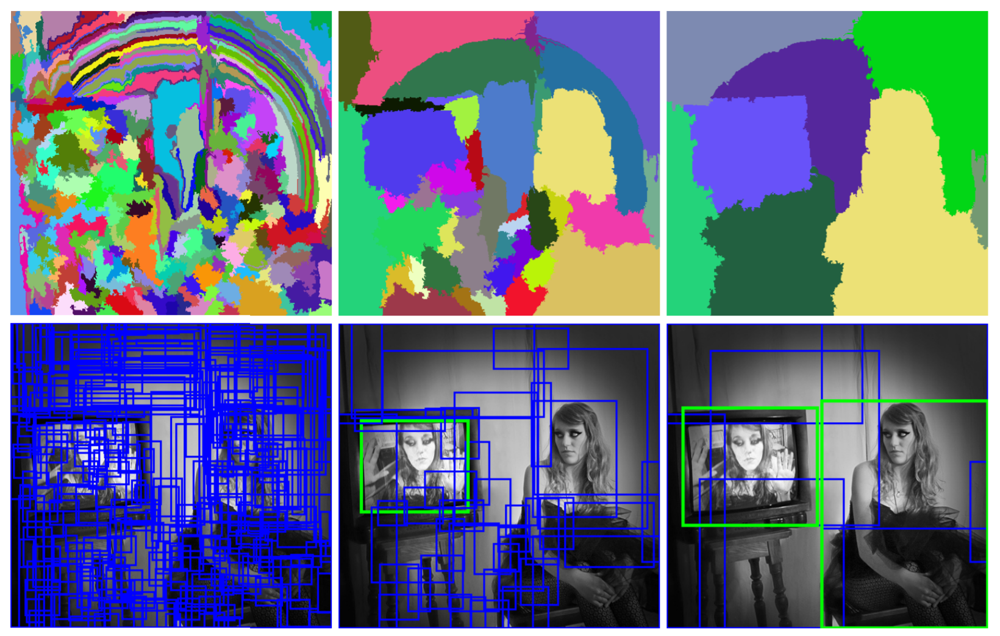

Точность R-CNN в то время была на высшем уровне, но скорость все еще была очень низкой (порядка 1 минуты на изображение на графическом процессоре).

### 3.2.3 Fast R-CNN Object Detector

[статья(2015)](https://arxiv.org/abs/1504.08083)

Но классификация 2000 картинок - это прям очень дорого! Поэтому решили ускорить процесс. Для этого алгоритм selective search Росс Гиршик доработал и значительно ускорили процесс. 

Идея заключалась в том, чтобы рассчитать одну карту характеристик для всего изображения вместо 2000 карт характеристик для 2000 регионов. 

Идея заключалась в том, что все вот эти регионы очень сильно пересекались. И все свертки и остальное мы вычисляем очень много-много раз для одних и тех же пикселей. И вопрос: можно ли это все как-то вычислять по-быстрее, не делать одних и тех же вычислений на одинаковых пикселях?  
И из-за работы свертки вытекает один способ как это можно сделать:

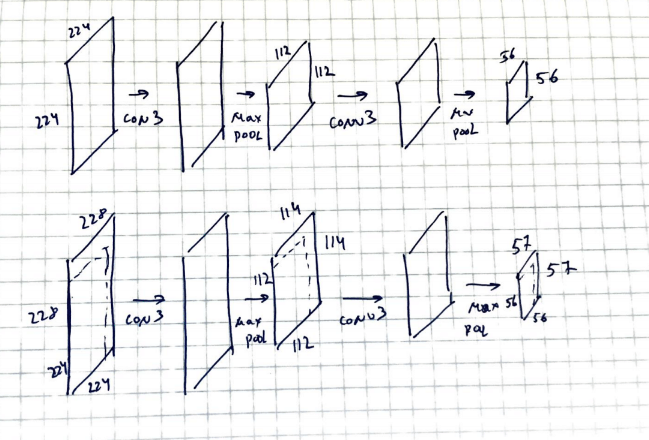

Собственно, на варианте выше мы подаем картинку 224х224 и пройдя стандартный набор сверток и пуллингов мы получим карту признаков 56х56. На следующем варианте мы подаем картинку 228х228. Сверточному слою в принципе все-равно и он ее аналогично обработает. На выходе получим размер 57х57.  
И если посмотрим на часть картинки 228х288 -> 57х57, которая соответсвует подрегиону 224х224 -> 56x56, то она будет соответсвовать проходу выше.
Т.о. мы просто можем прогнать конволюционную часть сети по картинке один раз и потом просто брать нужный срез из конволюционного выхода для нужного региона. 

Для каждого предложения региона объединяющий слой области интересов (RoI) извлекал вектор признаков фиксированной длины из карты признаков. Затем каждый вектор признаков использовался для двух целей:  
* Отнесите регион к одному из классов (например, собака, кошка, фон).
* Повысьте точность исходного ограничивающего прямоугольника с помощью регрессора ограничивающего прямоугольника.

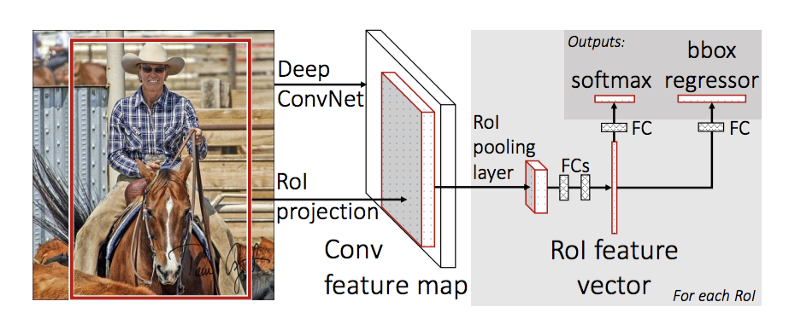

С этими изменениями алгоритм детектирования стал работать примерно за 3 секунды на изображение.

### 3.2.4 Faster R-CNN Object Detector

[статья(2015)](https://arxiv.org/abs/1506.01497)  
[Реализация в pytorch(torchvision)](https://pytorch.org/vision/stable/models.html#faster-r-cnn)

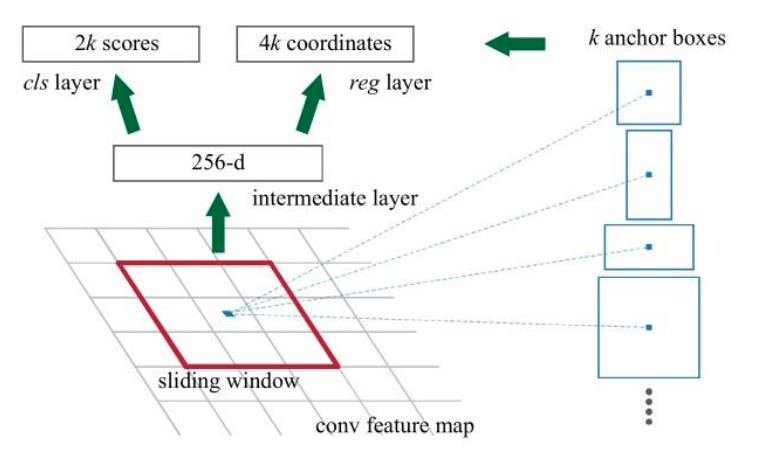

Идея следующая - регионы предложений тоже генерировать нейросетью.

План следующий. Мы берем картинку. Мы прогоняем свертки через всю картинку разом и в результате получаем наш feature maps, из которого мы раньше делали pooling и классифицировали какой там объект.  
Будем же использовать этот feature maps для того, что бы предсказывать какие у нас регионы.
Мы будем тренировать дополнительную систему (маленькую сеть) Region Proposal Network, которая будет проходится небольшим скользящим окном(sliding window) по всему feature map. И в каждом пикселе может предсказать есть или нет тут объект. Т.е. это такая сеть, которая плучает контекст вокруг зоны 3х3 пикселя, прогоняет через маленький внутрений fully-connected слой(256-d). И после этого  выдает какие тут есть боксы и какие у них координаты. 
Что значит какие тут боксы? Эту маленькую сеть учат предсказывать несколько вариантов общего размера объектов. Т.е. допустим берется k возможных конфигураций и размеров бокса. И для каждой такой конфигурации сеть говорит, какова вероятность такого бокса или вот такого бокса в заданной точке.

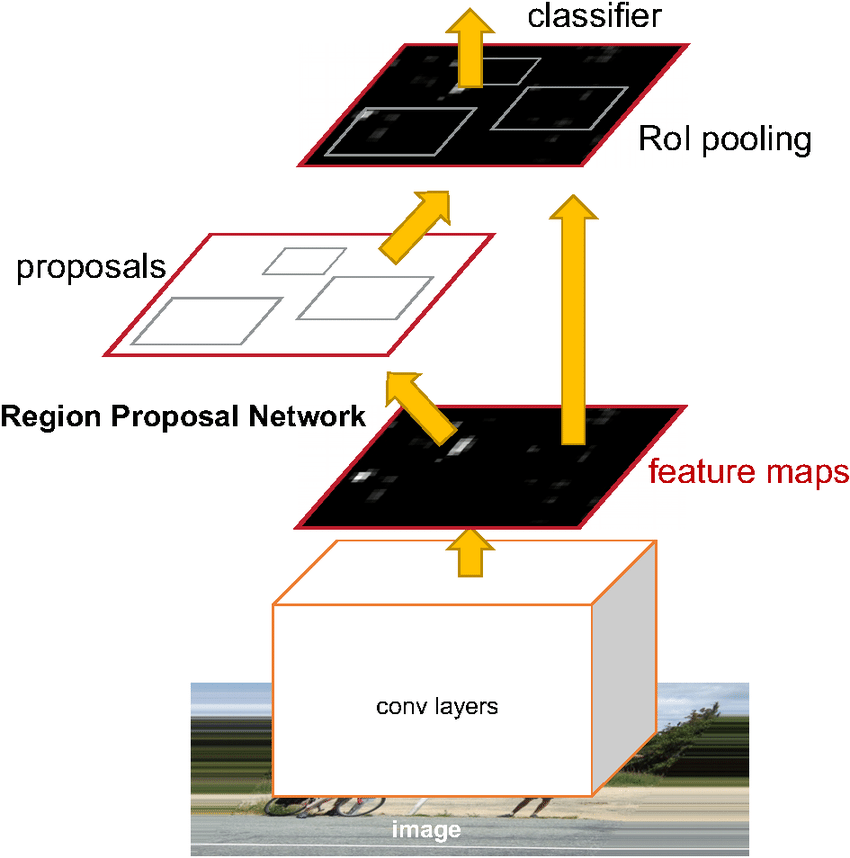

Пока что такая система конекта сетей - лучшая для решения задачи детекции. 
Время работы теперь порядка 0.2 секунды на изображение.

## 3.3 One-shot detectors

## 3.3.1 You only look once (YOLO)

[статья(2015)](https://arxiv.org/abs/1506.02640)

Есть подходы которые работают еще быстрее. Например подход yolo. Идея следующая: Взять картинку, прогнать ее один раз через сверточную сеть и получить результат. 

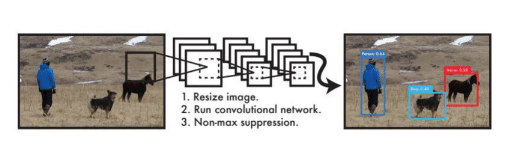

Картинка при этом делится на гриды(сетку) и сетка в каждом гриде предсказывает какой в нем основной класс перекрывает эту клетку больше всего. И так же она смотрит какой бокс в этой клетке. В итоге смотрим для каждой клетки какой класс и бокс. Усредняем их и потом получаем наши предсказания.

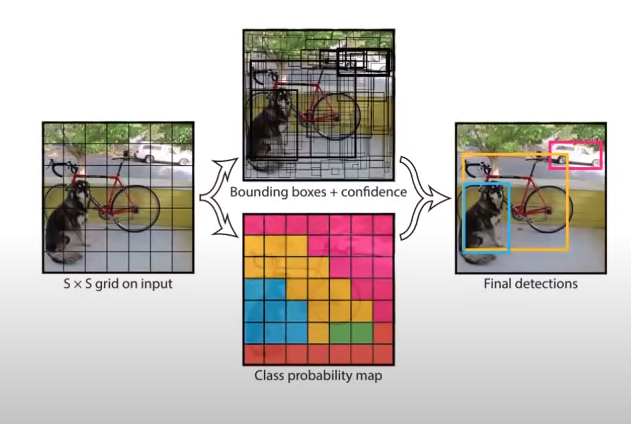

# 4. Loss-функции

## 4.1 В общем о функциях потерь в pytorch

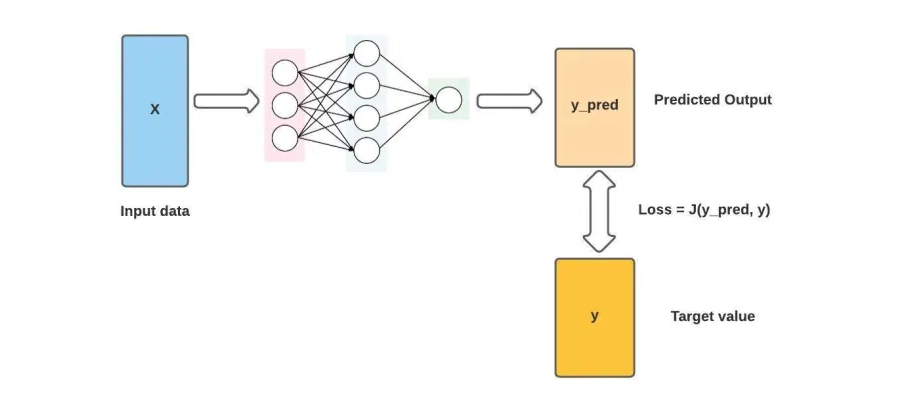

То, как вы конфигурируете свои функции потерь, может повлиять на производительность вашего алгоритма. Правильно настроив функцию потерь, вы можете убедиться, что ваша модель будет работать так, как вы хотите.

Ваши нейронные сети могут выполнять множество разных задач. Будь то классификация данных, например, группировка изображений животных по кошкам и собакам, или задачи регрессии, такие как прогнозирование ежемесячных доходов, или что-то еще. Каждая задача имеет свой результат и требует разного типа функции потерь.

К счастью для нас, есть функции потерь, которые мы можем использовать, чтобы максимально использовать задачи машинного обучения.

В этом параграфе мы поговорим о популярных функциях потерь в PyTorch и о создании пользовательских функций потерь.

Модуль torch.nn PyTorch имеет несколько стандартных функций потерь, которые вы можете использовать в своем проекте.

Чтобы добавить их, вам нужно сначала импортировать следующие библиотеки:

In [3]:
import torch 
import torch.nn as nn

Затем определите тип потерь, который вы хотите использовать. Вот как например определить функцию потерь средней абсолютной ошибки:

In [4]:
loss = nn.L1Loss()

## 4.2 Какие функции потерь доступны в pytorch

Вообще говоря, функции потерь в PyTorch делятся на две основные категории: потери регрессии и потери классификации.
Функции регрессионных потерь используются, когда модель прогнозирует непрерывное значение, например возраст человека.
Функции потери классификации используются, когда модель прогнозирует дискретное значение, например, является ли электронное письмо спамом или нет.

С полным списком доступных функций потерь можно ознакомится [здесь](https://pytorch.org/docs/stable/nn.html#loss-functions), а так же [здесь](https://pytorch.org/docs/stable/nn.functional.html#loss-functions)

### 4.2.1 Mean Absolute Error (L1 Loss Function)

In [5]:
torch.nn.L1Loss

torch.nn.modules.loss.L1Loss

[Средняя абсолютная ошибка](https://pytorch.org/docs/stable/generated/torch.nn.L1Loss.html#torch.nn.L1Loss) (MAE), также называемая потерями L1, вычисляет среднее значение суммы абсолютных разностей между фактическими и прогнозируемыми значениями.

Он проверяет размер ошибок в наборе прогнозируемых значений, не заботясь об их положительном или отрицательном направлении. Если абсолютные значения ошибок не используются, то отрицательные значения могут аннулировать положительные значения.

Потери Pytorch L1 выражаются как:
    
$$Loss(x,y) = |x-y|,$$

где x представляет фактическое значение, а y - прогнозируемое значение.

#### Когда его можно использовать?

* Задача регрессии, особенно когда распределение целевой переменной имеет выбросы, такие как маленькие или большие значения, которые находятся на большом расстоянии от среднего значения. Считается, что он более устойчив к выбросам.

Пример:

In [6]:
input = torch.randn(3, 5, requires_grad=True)
target = torch.randn(3, 5)

mae_loss = nn.L1Loss()
output = mae_loss(input, target)
output.backward()

print('input: ', input)
print('target: ', target)
print('output: ', output)

input:  tensor([[-1.0770, -0.0332,  1.6216, -0.5494, -0.1251],
        [-2.1757, -0.4723,  1.8580, -1.7873, -0.5400],
        [ 0.1446,  1.0914,  0.7022, -0.4809,  0.1369]], requires_grad=True)
target:  tensor([[ 0.0948, -0.5596, -1.1324, -1.5950, -0.6949],
        [-1.1568,  1.0279, -1.9684, -0.0705,  0.0466],
        [-0.8123,  0.5470, -0.3096,  0.1595, -0.1933]])
output:  tensor(1.2134, grad_fn=<L1LossBackward>)


### 4.2.2 Mean Squared Error Loss Function

In [7]:
torch.nn.MSELoss

torch.nn.modules.loss.MSELoss

[Среднеквадратичная ошибка](https://pytorch.org/docs/stable/generated/torch.nn.MSELoss.html#torch.nn.MSELoss) (MSE), также называемая потерями L2, вычисляет среднее значение квадратов разностей между фактическими и прогнозируемыми значениями.

Pytorch MSE Loss всегда выдает положительный результат, независимо от знака фактических и прогнозируемых значений. Чтобы повысить точность модели, вы должны попытаться уменьшить потери L2 - идеальное значение равно 0,0.

Возведение в квадрат подразумевает, что более крупные ошибки приводят к еще большим ошибкам, чем более мелкие.
Это наказывает модель за большие ошибки и поощряет мелкие ошибки.

Потери Pytorch L2 выражаются как:

$$Loss(x,y) = (x-y)^2$$

#### Когда он может быть использован?

MSE - это функция потерь по умолчанию для большинства проблем регрессии Pytorch.

### 4.2.3 Negative Log-Likelihood Loss Function

Функция Negative Log-Likelihood Loss (NLL) применяется только к моделям с функцией softmax в качестве выходного слоя активации. Softmax относится к функции активации, которая вычисляет нормированную экспоненциальную функцию каждой единицы в слое.

Функция Softmax выражается как:

$$ S({f_y}_i) = \frac{e^{{f_y}_i}}{\sum{j}e^f_j}$$

Функция принимает входной вектор размера N, а затем изменяет значения таким образом, что каждое из них находится между 0 и 1. Кроме того, она нормализует выходные данные так, чтобы сумма N значений вектора была равна 1.

NLL использует отрицательную коннотацию, поскольку вероятности (или правдоподобия) варьируются от нуля до единицы, а логарифмы значений в этом диапазоне отрицательны. В итоге величина убытка становится положительной.

В NLL минимизация функции потерь помогает нам получить лучший результат. Отрицательное логарифмическое правдоподобие получается из аппроксимации оценки максимального правдоподобия (MLE). Это означает, что мы стараемся максимизировать логарифмическую вероятность модели и, как результат, минимизировать NLL.

В NLL модель наказывается за правильный прогноз с меньшей вероятностью и поощряется за прогноз с более высокой вероятностью. Логарифм делает наказание.

NLL заботится не только о том, чтобы прогноз был правильным, но и о том, чтобы модель была уверена в прогнозе с высоким баллом.

Потери Pytorch NLL выражаются как:

$$Loss(x,y) = -log(y)$$

#### Когда он может быть использован?

* Проблемы многоклассовой классификации

Пример:

In [9]:
# size of input (N x C) is = 3 x 5
input = torch.randn(3, 5, requires_grad=True)
# every element in target should have 0 <= value < C
target = torch.tensor([1, 0, 4])

m = nn.LogSoftmax(dim=1)
nll_loss = nn.NLLLoss()
output = nll_loss(m(input), target)
output.backward()

print('input: ', input)
print('target: ', target)
print('output: ', output)

input:  tensor([[-0.9131, -0.5425,  0.8182,  0.6379,  0.4066],
        [-0.8154, -0.7725, -1.5394,  0.1638, -1.7639],
        [ 0.3126, -2.1586, -0.3618, -0.0127,  1.2350]], requires_grad=True)
target:  tensor([1, 0, 4])
output:  tensor(1.6026, grad_fn=<NllLossBackward>)


### 4.2.4 Cross-Entropy Loss Function

In [10]:
torch.nn.CrossEntropyLoss

torch.nn.modules.loss.CrossEntropyLoss

Эта [функция потерь](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html#torch.nn.CrossEntropyLoss) вычисляет разницу между двумя распределениями вероятностей для заданного набора событий или случайных величин.

Он используется для расчета оценки, которая суммирует среднюю разницу между прогнозируемыми значениями и фактическими значениями. Чтобы повысить точность модели, вы должны попытаться минимизировать оценку - оценка кросс-энтропии находится между 0 и 1, а идеальное значение равно 0.

Другие функции потерь, такие как квадрат потерь, наказывают за неправильные прогнозы. Кросс-энтропия сильно наказывает за то, что вы очень уверены и неправы.

В отличие от отрицательной логарифмической потери вероятности, которая не наказывает на основе достоверности прогнозов, кросс-энтропия наказывает неверные, но надежные прогнозы, а также правильные, но менее надежные прогнозы.

Функция кросс-энтропии имеет широкий спектр вариантов, наиболее распространенным из которых является бинарная кросс-энтропия (BCE). [BCE Loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss) в основном используется для моделей бинарной классификации; то есть модели, имеющие всего 2 класса.

Потеря кросс-энтропии Pytorch выражается как:

$$Loss(x,y) = - \sum xlog(y)$$

#### Когда он может быть использован?

* Задачи двоичной классификации, для которых это функция потерь по умолчанию в Pytorch.
* Создание уверенных моделей - прогноз будет точным и с большей вероятностью.

Пример:

In [11]:
input = torch.randn(3, 5, requires_grad=True)
target = torch.empty(3, dtype=torch.long).random_(5)

cross_entropy_loss = nn.CrossEntropyLoss()
output = cross_entropy_loss(input, target)
output.backward()

print('input: ', input)
print('target: ', target)
print('output: ', output)

input:  tensor([[-0.2819,  0.0368, -0.7423, -0.2503, -0.9080],
        [-3.7760,  1.6486, -0.2208,  1.4427,  0.7143],
        [-0.8656, -0.1780, -0.2488, -0.4367, -0.8142]], requires_grad=True)
target:  tensor([4, 1, 0])
output:  tensor(1.6709, grad_fn=<NllLossBackward>)


### 4.2.5 Hinge Embedding Loss Function

In [12]:
torch.nn.HingeEmbeddingLoss

torch.nn.modules.loss.HingeEmbeddingLoss

[Hinge Embedding Loss](https://pytorch.org/docs/stable/generated/torch.nn.HingeEmbeddingLoss.html#torch.nn.HingeEmbeddingLoss) используются для вычисления потерь, когда есть входной тензор x и тензор меток y. Целевые значения находятся в диапазоне {1, -1}, что позволяет использовать его для задач двоичной классификации.

С помощью функции Hinge Loss вы можете выдавать больше ошибок всякий раз, когда существует разница в знаке между фактическими значениями классов и предсказанными значениями классов. Это мотивирует примеры иметь правильный знак.

Выражается как:

$$Loss(x,y) = 	\left\{{x,   if y=1 \\max(0, \Delta -x)    if y=-1} \right.$$

#### Когда он может быть использован?

* Проблемы классификации, особенно при определении того, являются ли два входа разными или похожими.

In [13]:
input = torch.randn(3, 5, requires_grad=True)
target = torch.randn(3, 5)

hinge_loss = nn.HingeEmbeddingLoss()
output = hinge_loss(input, target)
output.backward()

print('input: ', input)
print('target: ', target)
print('output: ', output)

input:  tensor([[-0.4606,  0.4050, -0.2547, -1.5478,  0.1308],
        [-1.1680, -0.2557,  0.5629,  0.3731, -0.5862],
        [-0.6000, -0.5998, -0.6927, -1.8316, -1.7897]], requires_grad=True)
target:  tensor([[-1.3339,  0.5805, -1.4129, -0.2714, -0.4079],
        [-0.0370, -0.9597,  0.4749,  0.1544, -0.8679],
        [ 1.2063,  1.2376,  0.0797,  1.8206, -0.6067]])
output:  tensor(1., grad_fn=<MeanBackward0>)


### 4.2.6 Triplet Margin Loss Function

In [16]:
torch.nn.TripletMarginLoss

torch.nn.modules.loss.TripletMarginLoss

[Triplet Margin Loss](https://pytorch.org/docs/stable/generated/torch.nn.TripletMarginLoss.html#torch.nn.TripletMarginLoss) вычисляет критерий для измерения триплетных потерь в моделях. С помощью этой функции потерь вы можете рассчитать потери при наличии входных тензоров x1, x2, x3, а также запаса со значением больше нуля.

Триплет состоит из a (anchors), p (положительные примеры) и n (отрицательные примеры).

Потеря маржи Pytorch Triplet выражается как:

$$L(a,p,n) = max(d(a_i,d_i)- d(a_i, n_i) + margin, 0)$$

#### Когда он может быть использован?

* Определение относительного сходства между образцами
* Используется в задачах [определения контекста](https://neptune.ai/blog/content-based-image-retrieval-with-siamese-networks)

Пример:

In [18]:
anchor = torch.randn(100, 128, requires_grad=True)
positive = torch.randn(100, 128, requires_grad=True)
negative = torch.randn(100, 128, requires_grad=True)

triplet_margin_loss = nn.TripletMarginLoss(margin=1.0, p=2)
output = triplet_margin_loss(anchor, positive, negative)
output.backward()

print('anchor: ', anchor)
print('positive: ', positive)
print('negative: ', negative)
print('output: ', output)

anchor:  tensor([[ 1.0248,  1.3877,  0.1490,  ...,  0.6882, -0.0481,  0.1615],
        [ 0.4485,  0.1270,  1.5938,  ...,  1.0902,  0.2932, -1.7636],
        [-0.2802,  1.1760,  0.5615,  ...,  0.9012,  0.6197, -0.4142],
        ...,
        [ 0.9473, -0.5508, -0.5389,  ..., -1.8080,  0.4699, -1.1532],
        [ 0.2392,  0.3072, -1.7073,  ...,  0.4051, -1.2958,  0.4844],
        [ 0.7692, -1.1601,  3.3821,  ...,  0.9156,  1.2585,  0.6857]],
       requires_grad=True)
positive:  tensor([[ 0.2660,  0.9509, -0.8956,  ..., -0.0918, -0.8567, -0.1715],
        [-0.6199, -0.6929,  0.6257,  ...,  0.3859,  0.2928,  0.3686],
        [-0.9494,  1.0887, -1.0769,  ..., -0.2163, -1.4000, -1.6319],
        ...,
        [-0.6121, -0.0604,  1.1792,  ...,  1.4685, -0.5776,  0.0911],
        [-0.4933, -0.4241, -0.8335,  ...,  0.7113, -0.2593, -0.0617],
        [ 0.0693, -1.4964, -0.6385,  ...,  0.5440, -1.4910,  2.6827]],
       requires_grad=True)
negative:  tensor([[ 1.9485,  1.3644, -0.1089,  ...,  1.79

## 4.3 Создание своей функции потерь в pytorch

PyTorch позволяет вам создавать собственные пользовательские функции потерь для реализации в ваших проектах.
Вот как вы можете создать свою собственную простую функцию потери кросс-энтропии:

In [20]:
class customCrossEntropyFunc(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(customCrossEntropyFunc, self).__init__()
 
    def forward(self, my_outputs, my_labels):
        # Определение размера батча
        my_batch_size = my_outputs.size()[0] 
        # Вычисляем логирифмический softmax           
        my_outputs = F.log_softmax(my_outputs, dim=1)  
        # Выделяем значения которые соответсвуют лэйблам
        my_outputs = my_outputs[range(my_batch_size), my_labels] 
        # Возвращаем результат
        return -torch.sum(my_outputs)/number_examples

## 4.4 Loss в задаче object detector

Как же высчитывать loss для задачи когда у нас и классификация и регрессия прямоугольных коробок? В этом случае нужно отдельно высчитать loss для каждого из этих двух случаев и просто сложить их с определенным коэффициентом (обычно равен 0.5)  

$$L = L_c(p, y_c) + \lambda * L_2(\begin{bmatrix}x \\y \\ \omega\\ h\end{bmatrix} - y_b)$$


И этот подход работает аналогичным образом для остальных случаев, когда нейронная сеть должна решать несколько задач.

# 5. Подготовка данных

## 5.1 Dataset и Dataloader

С помощью модуля Dataset мы можем оформить наши данные как нам нужно. Для этого делаем следующим образом:

Импортируем нужные нам модули из [torch.utils.data](https://pytorch.org/docs/stable/data.html):

In [23]:
from torch.utils.data import Dataset, DataLoader

И затем создаем класс наследуемый от [Dataset](https://pytorch.org/docs/stable/data.html?highlight=dataset#torch.utils.data.Dataset):

In [ ]:
class customDataset(Dataset):
    # Здесь мы определяем наши данные. Обычно картинки и метки.
    def __init__(self, x, y, transforms=False):
        self.transforms = transforms
        self.x = x
        self.y = y
    
    # Так же нужно переопределить метод __len__
    def __len__(self):
        return len(self.paths)
    
    # И этот метод в который будет возвращать нам один сэмпл наших данных
    def __getitem__(self, idx):
        """Здесь производим необходимые преобразования над нашими данными"""
        return self.x[idx], self.y[idx]

И затем для конкретной загрузки наших данных в нейронную сеть используется [Dataloader](https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader):

In [ ]:
train_dataset = customDataset(x,y)
train_dataloader = Dataloader(train_dataset, batch_size=64, shufle=True)

## 5.2 Нормализация данных

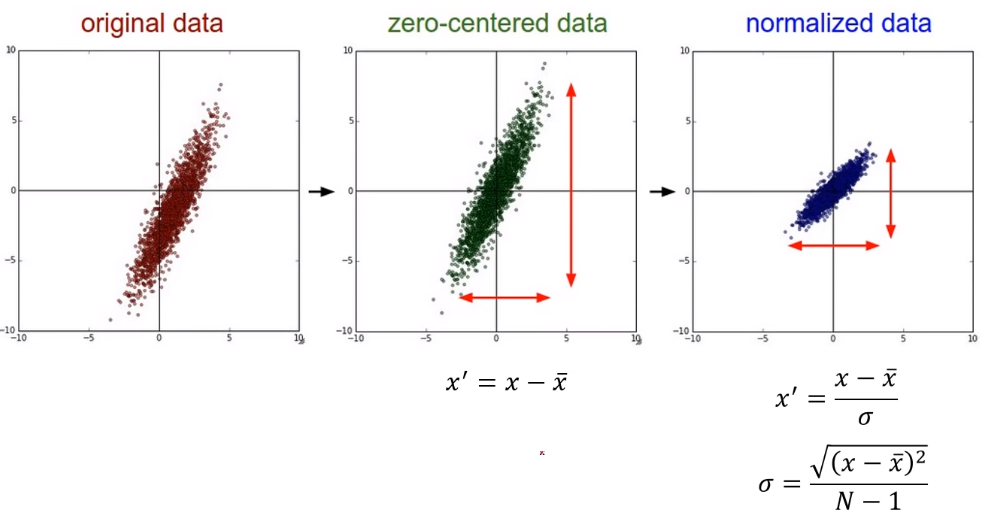

Одной из очень стандартных вещей, которая помогает нам при обучении - это нормализация данных. 
* Один из вариантов - это сместить наш набор данных к центру. Т.е. вычесть среднее. Т.о. берем смотрим на наш набор данных. Находим среднюю картинку. И из всех картинок вычитаем эту среднюю картинку.
* Другой вариант. Если по разным осям разные масштабы. Т.е. например если по одной оси данные меняются сильно, а по другой чуть-чуть, то имееет смыл провести нормализацию по масштабам. Чтобы оси были одинакового масштаба. В данном случае к формуле добавляется стандартное отклонение. N - количетсво элементов в датасете.

Для картинок обычно достаточно провести первый вариант нормализации.

## 5.3 Аугментация данных

Допустим, перед нами стоит задача обнаруживать и классифицировать разные типы фруктов. Теперь задача состоит в том, чтобы определить как тип фруктов, так и найти точные координаты фрукта на изображении. Но у нас есть проблема. Для обучения у нас есть 250 изображений, содержащих бананы. Для яблок и апельсинов у нас всего 120 изображений. С этим дисбалансом набора данных можно справиться с помощью Data Augmentation. Мы можем создавать поверхностные изображения, просто искажая существующие изображения. Искажения могут быть в виде поворота изображений, так что точка обзора объектов на изображении изменяется. Мы можем попробовать разные углы поворота для создания новых изображений. Точно так же мы играем с условиями освещения, резкостью или даже можем смещать изображения по вертикали или горизонтали, чтобы создавать изображения, которые в цифровом виде будут отличаться от существующего изображения.

# 2. Практика

Обнаружение объектов - очень популярная задача в компьютерном зрении, где по изображению вы прогнозируете (обычно прямоугольные) рамки вокруг объектов, присутствующих на изображении, а также распознаете типы объектов. На вашем изображении может быть несколько объектов, и существуют различные современные методы и архитектуры для решения этой проблемы, такие как Faster-RCNN и YOLO.

В данном вебинаре рассказывается о случае, когда на изображении присутствует только один интересующий объект. Основное внимание здесь уделяется не самой модели, а тому, как правильно читать изображение и его ограничивающую рамку, изменять размер и выполнять аугментации. Цель состоит в том, чтобы хорошо понять фундаментальные идеи, лежащие в основе обнаружения объектов, которые вы можете расширить, чтобы лучше понять более сложные методы.

Добавим необходимы библиотеки:

In [1]:
import os
import random
import math
from datetime import datetime
from collections import Counter
import pandas as pd
import numpy as np

import cv2
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.model_selection import train_test_split
import xml.etree.ElementTree as ET

import torch
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

### Постановка задачи

Для изображения, состоящего из дорожного знака, спрогнозировать ограничивающую рамку вокруг дорожного знака и определить тип дорожного знака.
Эти знаки могут принадлежать четырем различным классам:  
* Светофор
* Стоп
* Ограничение скорости
* Пешеходный переход

Это называется многозадачная задача обучения, поскольку она включает в себя выполнение двух задач: 
1) регрессия для нахождения координат ограничивающего прямоугольника,   
2) классификация для определения типа дорожного знака. 

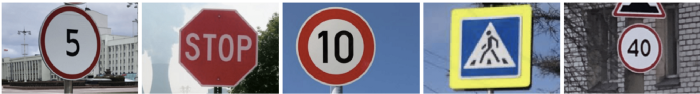

### Датасет

Мы будем использовать набор данных обнаружения дорожных знаков от [Kaggle](https://www.kaggle.com/andrewmvd/road-sign-detection)

Он состоит из 877 изображений. Это довольно несбалансированный набор данных, большинство изображений относится к классу ограничение скорости, но, поскольку мы больше сосредоточены на прогнозировании ограничивающей рамки, мы можем игнорировать дисбаланс.

### Загрузка данных

Описания для каждого изображения хранятся в отдельных файлах XML. Сделаем следующие шаги для подготовки данных для тренировки:  
* Пройдемся по директории annotations что бы получить все файлы .xml
* Прочитаем нужную нам информацию из каждого файла .xml используя xml.etree.ElementTree
* Создадим словарь содержащий filepath(путь до картинки), width, height, (xmin , xmax , ymin , ymax) (кординаты обрамляющего прямоугольника) и class и добавим словарь в список.
* Создадим pandas dataframe используя список словарей из прошлого пункта

In [2]:
images_path = Path('./road_signs/images')
anno_path = Path('./road_signs/annotations')

In [3]:
def filelist(root, file_type):
    """Функция возвращает полностью квалифицированный список файлов в директории"""
    return [os.path.join(directory_path, f) for directory_path, directory_name, 
            files in os.walk(root) for f in files if f.endswith(file_type)]

def generate_train_df (anno_path):
    annotations = filelist(anno_path, '.xml')
    anno_list = []
    for anno_path in annotations:
        root = ET.parse(anno_path).getroot()
        anno = {}
        anno['filename'] = Path(str(images_path) + '/'+ root.find("./filename").text)
        anno['width'] = root.find("./size/width").text
        anno['height'] = root.find("./size/height").text
        anno['class'] = root.find("./object/name").text
        anno['xmin'] = int(root.find("./object/bndbox/xmin").text)
        anno['ymin'] = int(root.find("./object/bndbox/ymin").text)
        anno['xmax'] = int(root.find("./object/bndbox/xmax").text)
        anno['ymax'] = int(root.find("./object/bndbox/ymax").text)
        anno_list.append(anno)
    return pd.DataFrame(anno_list)

In [4]:
df_train = generate_train_df(anno_path)

Преобразуем наши метки в классы:

In [5]:
class_dict = {'speedlimit': 0, 'stop': 1, 'crosswalk': 2, 'trafficlight': 3}
df_train['class'] = df_train['class'].apply(lambda x:  class_dict[x])

In [6]:
print(df_train.shape)
df_train.head()

(876, 8)


,filename,width,height,class,xmin,ymin,xmax,ymax
0,road_signs/images/road737.png,300,400,0,115,151,143,179
1,road_signs/images/road764.png,300,400,0,102,177,127,203
2,road_signs/images/road485.png,300,400,0,47,125,181,254
3,road_signs/images/road527.png,300,400,0,103,178,152,230
4,road_signs/images/road129.png,400,267,2,111,76,211,171


### Изменение размеров изображений и обрамляющих прямоугольников

Поскольку для обучения модели компьютерного зрения изображения должны иметь одинаковый размер, нам необходимо изменить размер наших изображений и соответствующих им ограничивающих рамок. Изменить размер изображения просто, но изменить размер ограничивающего прямоугольника немного сложнее, потому что каждый прямоугольник зависит от изображения и его размеров.

Вот основаная идея:

Преобразуем обрамляющий прямоугольник в изображение(маску) того же размера что и соотвествующее этому прямоугольнику изображение. Эта маска будет просто иметь 0 для заднего фона и 1 для области покрывающей обрамляющий прямоугольник.

Сначала прочитаем изображение:

In [7]:
def read_image(path):
    return cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)

In [8]:
def create_mask(bb, x):
    """Создаем маску для обрамляющего прямоугольника такого же шейпа как и изображение"""
    rows,cols,*_ = x.shape
    Y = np.zeros((rows, cols))
    bb = bb.astype(np.int)
    Y[bb[0]:bb[2], bb[1]:bb[3]] = 1.
    return Y

def mask_to_bb(Y):
    """Конвертируем маску Y в обрамляющий прямоугольник, принимая 0 как фоновый ненулевой объект """
    cols, rows = np.nonzero(Y)
    if len(cols)==0: 
        return np.zeros(4, dtype=np.float32)
    top_row = np.min(rows)
    left_col = np.min(cols)
    bottom_row = np.max(rows)
    right_col = np.max(cols)
    return np.array([left_col, top_row, right_col, bottom_row], dtype=np.float32)

def create_bb_array(x):
    """Генерируем массив обрамляющих прямоугольников из столбца train_df"""
    return np.array([x[5],x[4],x[7],x[6]])

In [9]:
def resize_image_bb(read_path,write_path,bb,sz):
    """Ресайзим изображение и его обрамляющий прямоугольник и записываем изображение в новый путь"""
    im = read_image(read_path)
    im_resized = cv2.resize(im, (int(1.49*sz), sz))
    Y_resized = cv2.resize(create_mask(bb, im), (int(1.49*sz), sz))
    new_path = str(write_path/read_path.parts[-1])
    cv2.imwrite(new_path, cv2.cvtColor(im_resized, cv2.COLOR_RGB2BGR))
    return new_path, mask_to_bb(Y_resized)

Применим все наши написанные функции:

In [10]:
new_paths = []
new_bbs = []
train_path_resized = Path('./road_signs/images_resized')
for index, row in df_train.iterrows():
    new_path,new_bb = resize_image_bb(row['filename'], train_path_resized, create_bb_array(row.values),300)
    new_paths.append(new_path)
    new_bbs.append(new_bb)
df_train['new_path'] = new_paths
df_train['new_bb'] = new_bbs

In [11]:
df_train.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,new_path,new_bb
0,road_signs/images/road737.png,300,400,0,115,151,143,179,road_signs/images_resized/road737.png,"[113.0, 171.0, 134.0, 213.0]"
1,road_signs/images/road764.png,300,400,0,102,177,127,203,road_signs/images_resized/road764.png,"[132.0, 151.0, 152.0, 189.0]"
2,road_signs/images/road485.png,300,400,0,47,125,181,254,road_signs/images_resized/road485.png,"[93.0, 69.0, 190.0, 269.0]"
3,road_signs/images/road527.png,300,400,0,103,178,152,230,road_signs/images_resized/road527.png,"[133.0, 153.0, 172.0, 226.0]"
4,road_signs/images/road129.png,400,267,2,111,76,211,171,road_signs/images_resized/road129.png,"[85.0, 123.0, 192.0, 235.0]"


### Пример получившегося сэмпла

In [12]:
im = cv2.imread(str(df_train.values[58][0]))
bb = create_bb_array(df_train.values[58])
print(im.shape)

(400, 300, 3)


In [13]:
Y = create_mask(bb, im)
mask_to_bb(Y)

array([206.,  92., 242., 129.], dtype=float32)

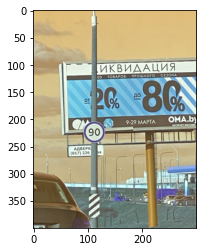

In [14]:
plt.imshow(im)

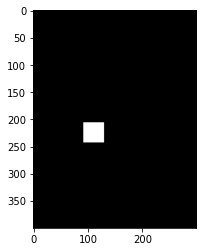

In [15]:
plt.imshow(Y, cmap='gray')

### Аугментация данных

Аугментация данных - это метод, позволяющий лучше обобщить нашу модель путем создания новых обучающих изображений с использованием различных вариантов существующих изображений. В нашем текущем обучающем наборе всего 800 изображений, поэтому увеличение данных очень важно, чтобы наша модель не переобучилась.  
Для этой задачи будем использовать переворот, поворот, центральную обрезку и случайную обрезку.

Единственное, что здесь нужно помнить, - это убедиться, что ограничивающая рамка также трансформируется так же, как и изображение. Для этого мы следуем тому же подходу, что и изменение размера - преобразуем ограничивающую рамку в маску, применяем те же преобразования к маске, что и исходное изображение, и извлекаем координаты ограничивающей рамки.

In [16]:
# Вырезаем кусок с изображения
def crop(im, r, c, target_r, target_c): 
    return im[r:r+target_r, c:c+target_c]

# Случайное вырезание части картинки
def random_crop(x, r_pix=8):
    """ Returns a random crop"""
    r, c,*_ = x.shape
    c_pix = round(r_pix*c/r)
    rand_r = random.uniform(0, 1)
    rand_c = random.uniform(0, 1)
    start_r = np.floor(2*rand_r*r_pix).astype(int)
    start_c = np.floor(2*rand_c*c_pix).astype(int)
    return crop(x, start_r, start_c, r-2*r_pix, c-2*c_pix)

# Центральное вырезание 
def center_crop(x, r_pix=8):
    r, c,*_ = x.shape
    c_pix = round(r_pix*c/r)
    return crop(x, r_pix, c_pix, r-2*r_pix, c-2*c_pix)

In [17]:
def rotate_cv(im, deg, y=False, mode=cv2.BORDER_REFLECT, interpolation=cv2.INTER_AREA):
    """ Поворачиваем наше изображение"""
    r,c,*_ = im.shape
    M = cv2.getRotationMatrix2D((c/2,r/2),deg,1)
    if y:
        return cv2.warpAffine(im, M,(c,r), borderMode=cv2.BORDER_CONSTANT)
    return cv2.warpAffine(im,M,(c,r), borderMode=mode, flags=cv2.WARP_FILL_OUTLIERS+interpolation)

def random_cropXY(x, Y, r_pix=8):
    """ Возвращает случайное вырезание"""
    r, c,*_ = x.shape
    c_pix = round(r_pix*c/r)
    rand_r = random.uniform(0, 1)
    rand_c = random.uniform(0, 1)
    start_r = np.floor(2*rand_r*r_pix).astype(int)
    start_c = np.floor(2*rand_c*c_pix).astype(int)
    xx = crop(x, start_r, start_c, r-2*r_pix, c-2*c_pix)
    YY = crop(Y, start_r, start_c, r-2*r_pix, c-2*c_pix)
    return xx, YY

# Трансформируем нашу картинку 
def transformsXY(path, bb, transforms):
    x = cv2.imread(str(path)).astype(np.float32)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)/255
    Y = create_mask(bb, x)
    if transforms:
        rdeg = (np.random.random()-.50)*20
        x = rotate_cv(x, rdeg)
        Y = rotate_cv(Y, rdeg, y=True)
        if np.random.random() > 0.5: 
            x = np.fliplr(x).copy()
            Y = np.fliplr(Y).copy()
        x, Y = random_cropXY(x, Y)
    else:
        x, Y = center_crop(x), center_crop(Y)
    return x, mask_to_bb(Y)

In [18]:
def create_corner_rect(bb, color='red'):
    bb = np.array(bb, dtype=np.float32)
    return plt.Rectangle((bb[1], bb[0]), bb[3]-bb[1], bb[2]-bb[0], color=color,
                         fill=False, lw=3)

def show_corner_bb(im, bb):
    plt.imshow(im)
    plt.gca().add_patch(create_corner_rect(bb))

### Пример изображения 

Оригинал:

road_signs/images_resized/road488.png


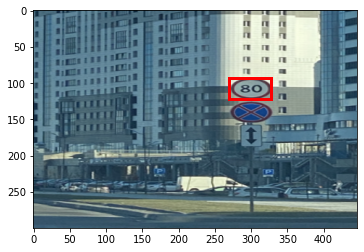

In [19]:
number = 45
im = cv2.imread(str(df_train.values[number][8]))
print(str(df_train.values[number][8]))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
show_corner_bb(im, df_train.values[number][9])

После трансформации:

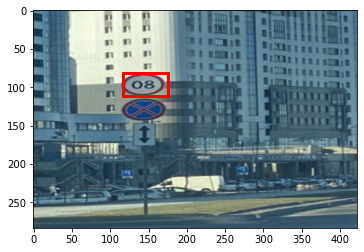

In [20]:
im, bb = transformsXY(str(df_train.values[number][8]),df_train.values[number][9],True )
show_corner_bb(im, bb)

### Датасет

Теперь, когда у нас есть дополнения к данным, мы можем создать набор данных PyTorch. Мы нормализуем изображения с помощью статистики ImageNet, потому что мы будем использовать предварительно обученную модель ResNet и применим аугментацию данных в нашем наборе данных во время обучения.

In [21]:
df_train = df_train.reset_index()
X = df_train[['new_path', 'new_bb']]
Y = df_train['class']
X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

In [22]:
def normalize(im):
    """Нормализация данных с помощью статистики ImageNet"""
    imagenet_stats = np.array([[0.485, 0.456, 0.406], [0.229, 0.224, 0.225]])
    return (im - imagenet_stats[0])/imagenet_stats[1]

In [23]:
class RoadDataset(Dataset):
    def __init__(self, paths, bb, y, transforms=False):
        self.transforms = transforms
        self.paths = paths.values
        self.bb = bb.values
        self.y = y.values
    def __len__(self):
        return len(self.paths)
    
    def __getitem__(self, idx):
        path = self.paths[idx]
        y_class = self.y[idx]
        x, y_bb = transformsXY(path, self.bb[idx], self.transforms)
        x = normalize(x)
        x = np.rollaxis(x, 2)
        return x, y_class, y_bb

In [24]:
train_ds = RoadDataset(X_train['new_path'],X_train['new_bb'] ,y_train, transforms=True)
valid_ds = RoadDataset(X_val['new_path'],X_val['new_bb'],y_val)

Загрузим все это в наш даталоадер:

In [25]:
batch_size = 16
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=batch_size)

### Определение модели

В качестве модели мы будем использовать очень простую предварительно обученную модель [resNet-34](https://pytorch.org/vision/stable/models.html#torchvision.models.resnet34). Поскольку здесь у нас есть две задачи, есть два последних слоя - регрессия ограничивающей рамки и классификатор изображений.

In [26]:
class BB_model(nn.Module):
    def __init__(self):
        super(BB_model, self).__init__()
        resnet = models.resnet34(pretrained=True)
        layers = list(resnet.children())[:8]
        self.features1 = nn.Sequential(*layers[:6])
        self.features2 = nn.Sequential(*layers[6:])
        self.classifier = nn.Sequential(nn.BatchNorm1d(512), nn.Linear(512, 4))
        self.bb = nn.Sequential(nn.BatchNorm1d(512), nn.Linear(512, 4))
        
    def forward(self, x):
        x = self.features1(x)
        x = self.features2(x)
        x = F.relu(x)
        x = nn.AdaptiveAvgPool2d((1,1))(x)
        x = x.view(x.shape[0], -1)
        return self.classifier(x), self.bb(x)

### Обучение

Для расчета потерь нам нужно принять во внимание как потерю классификации, так и потерю регрессии ограничивающего прямоугольника, поэтому мы используем комбинацию перекрестной энтропии и L1-потери (сумма всех абсолютных различий между истинным значением и прогнозируемыми координатами). Я масштабировал потери L1 в 1000 раз, потому что потери классификации и регрессии находятся в одном и том же диапазоне. Помимо этого, это стандартный цикл обучения PyTorch.

In [27]:
model = BB_model().cuda()
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = torch.optim.Adam(parameters, lr=0.006)
epochs = 15


In [29]:
for i in range(epochs):
    
    model.train()
    total = 0
    sum_loss = 0
    C=1000
    
    for x, y_class, y_bb in train_dl:
        batch = y_class.shape[0]
        x = x.cuda().float()
        y_class = y_class.cuda()
        y_bb = y_bb.cuda().float()
#         print(y_bb.shape)
#         print(y_class.shape)
        out_class, out_bb = model(x)
#         print(out_bb.shape)
#         print(out_class.shape)
        loss_class = F.cross_entropy(out_class, y_class, reduction="sum")
        loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
        loss_bb = loss_bb.sum()
        loss = loss_class + loss_bb/C
        loss = loss_class + loss_bb/C
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total += batch
        sum_loss += loss.item()
    train_loss = sum_loss/total
    
    # Eval
    model.eval()
    val_total = 0
    val_sum_loss = 0
    correct = 0
    
    for x, y_class, y_bb in valid_dl:
        batch = y_class.shape[0]
        x = x.cuda().float()
        y_class = y_class.cuda()
        y_bb = y_bb.cuda().float()
        out_class, out_bb = model(x)
        loss_class = F.cross_entropy(out_class, y_class, reduction="sum")

        loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
        loss_bb = loss_bb.sum()
        loss = loss_class + loss_bb/C
        _, pred = torch.max(out_class, 1)
        correct += pred.eq(y_class).sum().item()
        val_sum_loss += loss.item()
        val_total += batch
    val_loss = val_sum_loss/val_total
    val_acc = correct/val_total
    
    print("train_loss %.3f val_loss %.3f val_acc %.3f" % (train_loss, val_loss, val_acc))

train_loss 1.808 val_loss 2.067 val_acc 0.500
train_loss 1.281 val_loss 1.503 val_acc 0.580
train_loss 1.051 val_loss 2.146 val_acc 0.426
train_loss 1.208 val_loss 16.017 val_acc 0.773
train_loss 1.214 val_loss 2.087 val_acc 0.773
train_loss 1.126 val_loss 1.114 val_acc 0.818
train_loss 1.269 val_loss 2.790 val_acc 0.756
train_loss 1.021 val_loss 0.828 val_acc 0.807
train_loss 1.072 val_loss 1.746 val_acc 0.784
train_loss 0.943 val_loss 1.118 val_acc 0.767
train_loss 1.001 val_loss 14.482 val_acc 0.511
train_loss 1.047 val_loss 1.182 val_acc 0.773
train_loss 0.977 val_loss 1.134 val_acc 0.778
train_loss 1.007 val_loss 0.786 val_acc 0.801
train_loss 0.948 val_loss 0.747 val_acc 0.818


Трюк: мы можешь после прохождения обучения изменить шаг обучения и продолжить:

In [30]:
for i, param_group in enumerate(optimizer.param_groups):
        param_group["lr"] = 0.001

In [31]:
for i in range(epochs):
    
    model.train()
    total = 0
    sum_loss = 0
    C=1000
    
    for x, y_class, y_bb in train_dl:
        batch = y_class.shape[0]
        x = x.cuda().float()
        y_class = y_class.cuda()
        y_bb = y_bb.cuda().float()
        out_class, out_bb = model(x)
        loss_class = F.cross_entropy(out_class, y_class, reduction="sum")
        loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
        loss_bb = loss_bb.sum()
        loss = loss_class + loss_bb/C
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total += batch
        sum_loss += loss.item()
    train_loss = sum_loss/total
    
    # Eval
    model.eval()
    val_total = 0
    val_sum_loss = 0
    correct = 0
    
    for x, y_class, y_bb in valid_dl:
        batch = y_class.shape[0]
        x = x.cuda().float()
        y_class = y_class.cuda()
        y_bb = y_bb.cuda().float()
        out_class, out_bb = model(x)
        loss_class = F.cross_entropy(out_class, y_class, reduction="sum")
#         print(out_bb.shape)
#         print(out_bb.shape)
        loss_bb = F.l1_loss(out_bb, y_bb, reduction="none").sum(1)
        loss_bb = loss_bb.sum()
        loss = loss_class + loss_bb/C
        _, pred = torch.max(out_class, 1)
        correct += pred.eq(y_class).sum().item()
        val_sum_loss += loss.item()
        val_total += batch
    val_loss = val_sum_loss/val_total
    val_acc = correct/val_total
    
    print("train_loss %.3f val_loss %.3f val_acc %.3f" % (train_loss, val_loss, val_acc))

train_loss 0.860 val_loss 0.712 val_acc 0.812
train_loss 0.844 val_loss 0.714 val_acc 0.830
train_loss 0.875 val_loss 0.692 val_acc 0.824
train_loss 0.855 val_loss 0.709 val_acc 0.818
train_loss 0.835 val_loss 0.695 val_acc 0.801
train_loss 0.838 val_loss 0.690 val_acc 0.801
train_loss 0.821 val_loss 0.677 val_acc 0.824
train_loss 0.855 val_loss 0.691 val_acc 0.824
train_loss 0.817 val_loss 0.677 val_acc 0.824
train_loss 0.849 val_loss 0.669 val_acc 0.824
train_loss 0.824 val_loss 0.681 val_acc 0.830
train_loss 0.806 val_loss 0.675 val_acc 0.835
train_loss 0.804 val_loss 0.714 val_acc 0.830
train_loss 0.810 val_loss 0.729 val_acc 0.824
train_loss 0.808 val_loss 0.732 val_acc 0.830


# Тестирование

In [ ]:
# resizing test image
im = read_image('./road_signs/images_resized/road789.png')
im = cv2.resize(im, (int(1.49*300), 300))
cv2.imwrite('./road_signs/road_signs_test/road789.jpg', cv2.cvtColor(im, cv2.COLOR_RGB2BGR))

In [ ]:
# test Dataset
test_ds = RoadDataset(pd.DataFrame([{'path':'./road_signs/road_signs_test/road789.jpg'}])['path'],pd.DataFrame([{'bb':np.array([0,0,0,0])}])['bb'],pd.DataFrame([{'y':[0]}])['y'])
x, y_class, y_bb = test_ds[0]

In [78]:
xx = torch.FloatTensor(x[None,])
xx.shape

torch.Size([1, 3, 284, 423])

In [79]:
# prediction
out_class, out_bb = model(xx.cuda())
out_class, out_bb

(tensor([[ 2.4659, -0.9567, -0.5194, -2.1793]], device='cuda:0',
        grad_fn=<AddmmBackward>),
 tensor([[112.4208, 178.3608, 147.0345, 241.7733]], device='cuda:0',
        grad_fn=<AddmmBackward>))

In [80]:
# predicted class
torch.max(out_class, 1)

torch.return_types.max(
values=tensor([2.4659], device='cuda:0', grad_fn=<MaxBackward0>),
indices=tensor([0], device='cuda:0'))

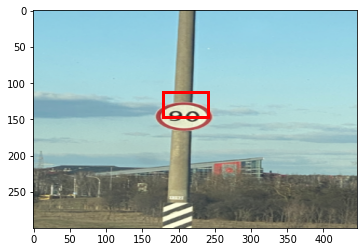

In [81]:
# predicted bounding box
bb_hat = out_bb.detach().cpu().numpy()
bb_hat = bb_hat.astype(int)
show_corner_bb(im, bb_hat[0])

### Бонус:

Время не стоит на месте и методы детекции тоже улучшаются. Относительно недавно появилась новая архитектра нейронной сети - [сети с вниманием](https://habr.com/ru/post/458992/) (Attention Neural Networks).
Прикладываю ссылку на интересный проект по этому поводу. На pytorch.  
[статья](https://arxiv.org/pdf/1612.03928.pdf)  
[git-репозиторий](https://github.com/szagoruyko/attention-transfer)